<a href="https://colab.research.google.com/github/Ankit8125/Dog-Vision/blob/main/Dog_Vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# from google.colab import drive
# drive.mount('/content/drive')

-d = destination

In [ ]:
# !unzip "drive/MyDrive/Dog Vision/dog-breed-identification (1).zip" -d "drive/MyDrive/Dog Vision/"

# End-to-end Multi-class Dog Breed Classfication
This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.0 and TensorFlow Hub

## 1. Problem
Identifying the breed of a dog given an image of a dog

## 2. Data
The data we're using is from Kaggle's dog breed identification competition.
https://www.kaggle.com/c/dog-breed-identification/data

## 3. Evaluation
The evaluation is a file with preiction probabilities for each dog breed of each test image.
https://www.kaggle.com/c/dog-breed-identification/overview

## 4. Features
Some info. about the data:
  * Using deep learning/ transfer learning to predict
  * There are 120 breeds of dogs (Meaning there are 120 different classes.)
  * There are around 10000+ images in the training set (these images have labels (aka output of those input images))
  * There are around 10000+ images in the test set (these images have no labels, because we'll want to predict them)

### Get our workspace ready
* Import TensorFlow and TensorFlow Hub
* Make sure we're using a GPU

In [1]:
# Import necessary tools
import tensorflow as tf
import tensorflow_hub as hub
print("TF version: ",tf.__version__)
print("TF Hub version: ",hub.__version__)

# Check for GPU availability
print("GPU", "Available" if tf.config.list_physical_devices("GPU") else "Not Available")

TF version:  2.15.0
TF Hub version:  0.16.1
GPU Available


## Getting out data ready (turning into Tensors)
With all machine learning models, our data has to be in numerical format. So that's what we will be doing first. (numerical representation).
Let's start by accessing our data and checking out the labels

In [2]:
# Checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/Dog Vision/dog-breed-identification/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [3]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: >

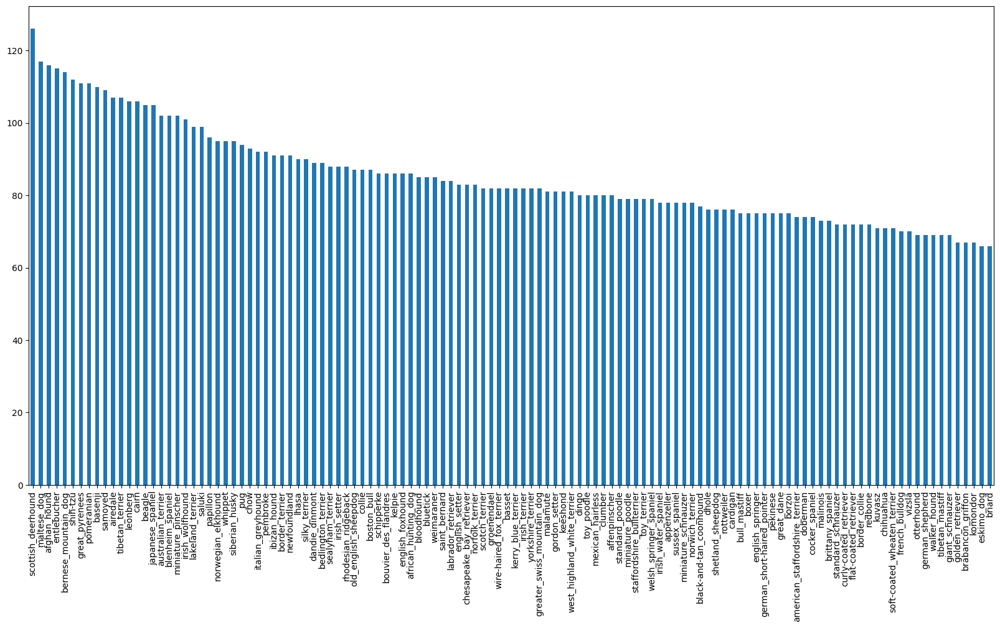

In [4]:
# How many images are there for each breed
labels_csv["breed"].value_counts().plot.bar(figsize = (20,10))

In [5]:
labels_csv["breed"].value_counts().median()
# It's recommended to have atleast 10 images in each class for training/testing!

82.0

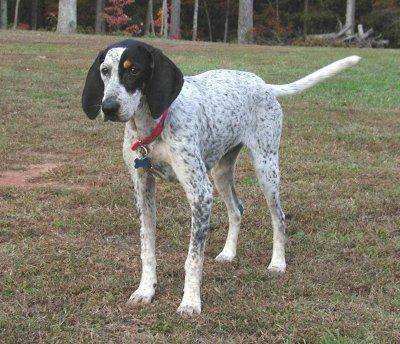

In [6]:
# Let's view an image from training set
# ctrl + shift + space = docstring
from IPython.display import Image
Image("drive/MyDrive/Dog Vision/dog-breed-identification/train/00214f311d5d2247d5dfe4fe24b2303d.jpg")

### Getting images and their labels
Let's get a list of all our image file pathnames.

In [7]:
# Create pathnames from image ID's
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [8]:
# Create pathnames from image ID's
filenames = ["drive/MyDrive/Dog Vision/dog-breed-identification/train/" + fname + ".jpg" for fname in labels_csv["id"]] # fname = filename
# It' saying: Create a list of 'fname' for 'fname' in labels_csv["id"]

# Check the first 10
filenames[:10]

['drive/MyDrive/Dog Vision/dog-breed-identification/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [9]:
import os
os.listdir("drive/MyDrive/Dog Vision/dog-breed-identification/train/")[:10]
# 'os.listdir' goes into that directory and then lists all the files in that directory

['e792459978c605f740a2b553ec1608f6.jpg',
 'e728ffc9ca204977f2cc3c502c68d823.jpg',
 'e748f61d39da506904f531c7732df512.jpg',
 'e795a13bbfa8a72daeb315646f83068a.jpg',
 'e7faa5748d8320f604aeb3fd5bbe4ab0.jpg',
 'e73d792517b5e717709ed11782adddf8.jpg',
 'e734678e0c18e103c41023e11b92e012.jpg',
 'e6eb11571ef963fac4d2300df3122f85.jpg',
 'e6ff9171c960a31363798343982338c4.jpg',
 'e7c5692d044250d303a839d989132bf1.jpg']

In [10]:
# Check whether number of filenames matches number of actual image files
import os
if len(os.listdir("drive/MyDrive/Dog Vision/dog-breed-identification/train/")) == len(filenames):
  print("Filenames match actual amount of files! Proceed")
else:
  print("Filenames do not match actual amount of files, check the target directory")

Filenames match actual amount of files! Proceed


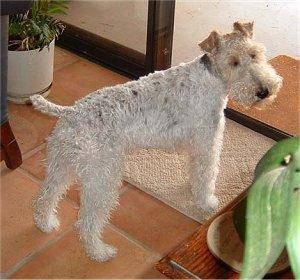

In [11]:
# One more check
Image(filenames[7000])

In [12]:
labels_csv["breed"][7000], labels_csv["id"][7000]

('wire-haired_fox_terrier', 'af750c18726a7dd02f0880a9bf662e31')

Since we've now got out training image filepaths in a list, let's prepare our labels

In [13]:
import numpy as np
labels = labels_csv["breed"].to_numpy()
# labels = np.array(labels) # does same thing as above
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [14]:
len(labels)

10222

In [15]:
# See if number of labels matches number of filenames
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames!")
else:
  print("Number of labels does not match number of filenames!, check data directories")

Number of labels matches number of filenames!


In [16]:
# Find the unique label values
unique_breeds = np.unique(labels) # np.unique in NumPy returns the sorted unique elements of an array.
len(unique_breeds), unique_breeds

(120,
 array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
        'american_staffordshire_terrier', 'appenzeller',
        'australian_terrier', 'basenji', 'basset', 'beagle',
        'bedlington_terrier', 'bernese_mountain_dog',
        'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
        'bluetick', 'border_collie', 'border_terrier', 'borzoi',
        'boston_bull', 'bouvier_des_flandres', 'boxer',
        'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
        'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
        'chow', 'clumber', 'cocker_spaniel', 'collie',
        'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
        'doberman', 'english_foxhound', 'english_setter',
        'english_springer', 'entlebucher', 'eskimo_dog',
        'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
        'german_short-haired_pointer', 'giant_schnauzer',
        'golden_retriever', 'gordon_setter'

In [17]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [18]:
# Turn every array into boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [19]:
len(boolean_labels)

10222

In [20]:
# Example: Turning boolean array into integers
print(labels[0])
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be '1' where the sample occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [21]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [22]:
filenames[:10]

['drive/MyDrive/Dog Vision/dog-breed-identification/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

### Creating our own Validation Set
Since the dataset from Kaggle doesn't come with a validation set, we're going to create our own

In [23]:
# Setup 'x' and 'y' variables
x = filenames # represents the location of every image in training set
y = boolean_labels # represents the boolean value of each sample over full training set (or) boolean value numpy representations of the labels

In [24]:
len(filenames)

10222

We're going to start off experimenting with ~1000 images and increase as needed.

In [25]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 # @param{type:"slider", min:1000, max:10000, step:1000}

In [26]:
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES
x_train, x_val, y_train, y_val = train_test_split(x[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size = 0.2,
                                                  random_state = 42) # similar to np.random.seed(42)
len(x_train), len(y_train), len(x_val), len(y_val)

(800, 800, 200, 200)

In [27]:
# Let's have a gaze at the training data to check if we are working with right variables
x_train[:2], y_train[:2]

(['drive/MyDrive/Dog Vision/dog-breed-identification/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Dog Vision/dog-breed-identification/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         Fa

## Preprocessing Images (turning images into Tensors)
* Tensors are a numerical representation, kind of like a matrix (we can also use it for audio, text-passages, etc).
* Tensors are very similar to numpy arrays
To preprocess our images into Tensors we're going to write a function which does few things: (this func. is specific to images)
1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into Tensors
4. Resize the `image` to be a shape of (224,224)
5. Return the modified `image`

### Before we do, let's see what importing an image looks like

In [28]:
# Convert image to NumPy array
from matplotlib.pyplot import imread
# imread = image read
image = imread(filenames[37])
image.shape
# output = height, width, color channel: {red, green, blue pixels}

(332, 500, 3)

array([[[ 16,  38,  52],
        [ 12,  31,  45],
        [ 14,  28,  41],
        ...,
        [ 71,  42,  44],
        [ 70,  41,  43],
        [ 69,  40,  42]],

       [[ 12,  34,  48],
        [ 10,  29,  43],
        [ 14,  30,  43],
        ...,
        [ 71,  42,  44],
        [ 70,  41,  43],
        [ 69,  40,  42]],

       [[  7,  30,  46],
        [  8,  30,  44],
        [ 16,  32,  47],
        ...,
        [ 71,  43,  42],
        [ 70,  42,  41],
        [ 69,  41,  40]],

       ...,

       [[171, 119,  97],
        [172, 120,  98],
        [173, 121,  97],
        ...,
        [183, 102,  37],
        [182, 101,  36],
        [181, 100,  35]],

       [[170, 118,  96],
        [170, 118,  96],
        [171, 119,  95],
        ...,
        [180,  99,  36],
        [179,  98,  35],
        [178,  97,  34]],

       [[169, 117,  95],
        [169, 117,  95],
        [170, 118,  94],
        ...,
        [179,  98,  35],
        [178,  97,  34],
        [177,  96,  33]]], dtype=uint8)
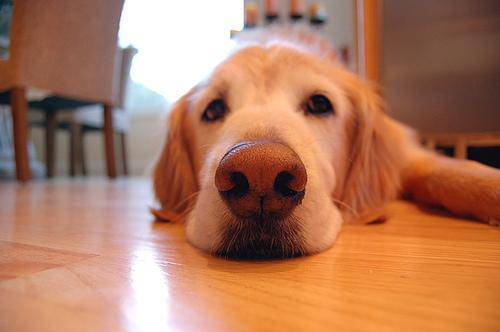

In [29]:
image

In [30]:
image.max(), image.min() # output = RGB pixel values lies between 0 to 255

(255, 0)

In [31]:
# Turn image into a tensor
tf.constant(image)

<tf.Tensor: shape=(332, 500, 3), dtype=uint8, numpy=
array([[[ 16,  38,  52],
        [ 12,  31,  45],
        [ 14,  28,  41],
        ...,
        [ 71,  42,  44],
        [ 70,  41,  43],
        [ 69,  40,  42]],

       [[ 12,  34,  48],
        [ 10,  29,  43],
        [ 14,  30,  43],
        ...,
        [ 71,  42,  44],
        [ 70,  41,  43],
        [ 69,  40,  42]],

       [[  7,  30,  46],
        [  8,  30,  44],
        [ 16,  32,  47],
        ...,
        [ 71,  43,  42],
        [ 70,  42,  41],
        [ 69,  41,  40]],

       ...,

       [[171, 119,  97],
        [172, 120,  98],
        [173, 121,  97],
        ...,
        [183, 102,  37],
        [182, 101,  36],
        [181, 100,  35]],

       [[170, 118,  96],
        [170, 118,  96],
        [171, 119,  95],
        ...,
        [180,  99,  36],
        [179,  98,  35],
        [178,  97,  34]],

       [[169, 117,  95],
        [169, 117,  95],
        [170, 118,  94],
        ...,
        [179,  98,  3

Now we've seen what an image looks like as a Tensor, let's make a function to preprocess them.

1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into Tensors
4. Normalize our `image` (convert colour channel values from 0-255 to 0-1).
5. Resize the `image` to be a shape of (224,224)
6. Return the modified `image`


In [32]:
tensor = tf.io.read_file(filenames[19])
tensor

<tf.Tensor: shape=(), dtype=string, numpy=b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\n\x07\x07\x08\x07\x06\n\x08\x08\x08\x0b\n\n\x0b\x0e\x18\x10\x0e\r\r\x0e\x1d\x15\x16\x11\x18#\x1f%$"\x1f"!&+7/&)4)!"0A149;>>>%.DIC<H7=>;\xff\xdb\x00C\x01\n\x0b\x0b\x0e\r\x0e\x1c\x10\x10\x1c;("(;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;\xff\xc0\x00\x11\x08\x00\xa0\x00\xa0\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1f\x00\x00\x01\x05\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x03\x04\x05\x06\x07\x08\t\n\x0b\xff\xc4\x00\xb5\x10\x00\x02\x01\x03\x03\x02\x04\x03\x05\x05\x04\x04\x00\x00\x01}\x01\x02\x03\x00\x04\x11\x05\x12!1A\x06\x13Qa\x07"q\x142\x81\x91\xa1\x08#B\xb1\xc1\x15R\xd1\xf0$3br\x82\t\n\x16\x17\x18\x19\x1a%&\'()*456789:CDEFGHIJSTUVWXYZcdefghijstuvwxyz\x83\x84\x85\x86\x87\x88\x89\x8a\x92\x93\x94\x95\x96\x97\x98\x99\x9a\xa2\xa3\xa4\xa5\xa6\xa7\xa8\xa9\xaa\xb2\xb3\xb4\xb5\xb6\xb7\xb8\xb9\xba\xc2\xc3\xc4\xc5\xc6\xc7\xc8\xc9\

In [33]:
tensor = tf.image.decode_jpeg(tensor, channels = 3)

In [34]:
tf.image.convert_image_dtype(tensor, tf.float32)

<tf.Tensor: shape=(160, 160, 3), dtype=float32, numpy=
array([[[0.14901961, 0.16862746, 0.14117648],
        [0.14901961, 0.16862746, 0.14117648],
        [0.14509805, 0.16470589, 0.13725491],
        ...,
        [0.08627451, 0.10980393, 0.10196079],
        [0.07843138, 0.10196079, 0.09411766],
        [0.07058824, 0.09411766, 0.08627451]],

       [[0.1137255 , 0.13333334, 0.10588236],
        [0.10980393, 0.12941177, 0.10196079],
        [0.10196079, 0.12156864, 0.09411766],
        ...,
        [0.08235294, 0.10588236, 0.09803922],
        [0.07450981, 0.09803922, 0.09019608],
        [0.06666667, 0.09019608, 0.08235294]],

       [[0.08235294, 0.10196079, 0.07450981],
        [0.07450981, 0.09411766, 0.06666667],
        [0.0627451 , 0.08235294, 0.05490196],
        ...,
        [0.07450981, 0.09803922, 0.09019608],
        [0.07058824, 0.09411766, 0.08627451],
        [0.06666667, 0.09019608, 0.08235294]],

       ...,

       [[0.46274513, 0.5176471 , 0.5176471 ],
        [0.44

In [35]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path, img_size = IMG_SIZE):
  """
  Takes an image file path and turns the image into a Tensor
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # tf.io.read_file() : Reads the contents of file ; {io = input-output} ; returns a tensor of dtype "string", with the file contents.

  # Turn the jpeg image to numerical Tensor with 3 colour channels (RGB)
  image = tf.image.decode_jpeg(image, channels = 3)

  # Convert the colour channel values from 0-255 to 0-1 values (aka Normalization)
  image = tf.image.convert_image_dtype(image, tf.float32)

  # Resize the image to out desired value (224,224)
  image = tf.image.resize(image, size = [IMG_SIZE, IMG_SIZE])

  return image


## Turning our data into batches
Why turn our data into batches?

If you try to process 10000+ images in one go... they all might not fit into memory

So that's why we do about 32 (this is the batch size) images at a time (you can manually adjust the batch size if needed)

In order to use TensorFlow effectively, we need our data in the form of Tensor tuples which look like this : `(image, label)`

In [36]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label, process the image and returns a tuple of (image, label)
  """
  image = process_image(image_path)
  return image, label


## Setup 'x' and 'y' variables
* x = filenames -> represents the location of every image in training set
* y = boolean_labels -> represents the boolean value of each sample over full training set (or) boolean value numpy representations of the labels

In [37]:
# Demo of the above
(process_image(x[37]), tf.constant(y[37]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.04078788, 0.1300736 , 0.17471646],
         [0.06911422, 0.12580189, 0.16169125],
         [0.09452   , 0.15357144, 0.18363066],
         ...,
         [0.2787465 , 0.18070728, 0.165021  ],
         [0.26999298, 0.16803218, 0.16411062],
         [0.26123947, 0.15927866, 0.1553571 ]],
 
        [[0.02544487, 0.12040286, 0.16788183],
         [0.08807461, 0.14519277, 0.1819431 ],
         [0.09595495, 0.15274768, 0.1880418 ],
         ...,
         [0.2787465 , 0.18070728, 0.165021  ],
         [0.26999298, 0.16803218, 0.16411062],
         [0.26123947, 0.15927866, 0.1553571 ]],
 
        [[0.03230605, 0.13282001, 0.18834034],
         [0.10315127, 0.17253122, 0.2139528 ],
         [0.10523616, 0.1743485 , 0.21529584],
         ...,
         [0.2787465 , 0.18070728, 0.165021  ],
         [0.26999298, 0.1688375 , 0.16249998],
         [0.26123947, 0.16008398, 0.15374646]],
 
        ...,
 
        [[0.67481905, 0.4708975 

Now we've got a way to turn our data into tuples of Tensors in the form: `(image, label)` , let's make a function to turn all our data (x & y) into batches!

In [38]:
# Define the batch size : 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(x, y=None, batch_size = BATCH_SIZE, valid_data = False, test_data = False):
  """
  Creates batches of data out of image (x) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data
  Also accepts test data as input (no labels).
  """

  # If the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating the test batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x))) # Creates a Dataset whose elements are slices of the given tensors. {returns: dataset}
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating valid data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # image filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  # Data is training dataset
  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                               tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size = len(x))

    # Create (image, label) tuples (this also turn image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [39]:
# Create training and validation batches
train_data = create_data_batches(x_train, y_train)
val_data = create_data_batches(x_val, y_val, valid_data = True)

Creating training data batches...
Creating valid data batches...


In [40]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches
Our data is now in batches, let's visualize them

In [41]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """
  # Setup the figure
  plt.figure(figsize = (10,10))

  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots(5 rows, 5 columns)
    ax = plt.subplot(5,5,i+1) # rows, columns, index
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")


In [42]:
y[0].argmax(), unique_breeds[y[0].argmax()], unique_breeds

(19,
 'boston_bull',
 array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
        'american_staffordshire_terrier', 'appenzeller',
        'australian_terrier', 'basenji', 'basset', 'beagle',
        'bedlington_terrier', 'bernese_mountain_dog',
        'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
        'bluetick', 'border_collie', 'border_terrier', 'borzoi',
        'boston_bull', 'bouvier_des_flandres', 'boxer',
        'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
        'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
        'chow', 'clumber', 'cocker_spaniel', 'collie',
        'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
        'doberman', 'english_foxhound', 'english_setter',
        'english_springer', 'entlebucher', 'eskimo_dog',
        'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
        'german_short-haired_pointer', 'giant_schnauzer',
        'golden_retriever', 

In [43]:
train_data # It's in format of a batch, so we need to unbatch it so that we can visualize it.

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

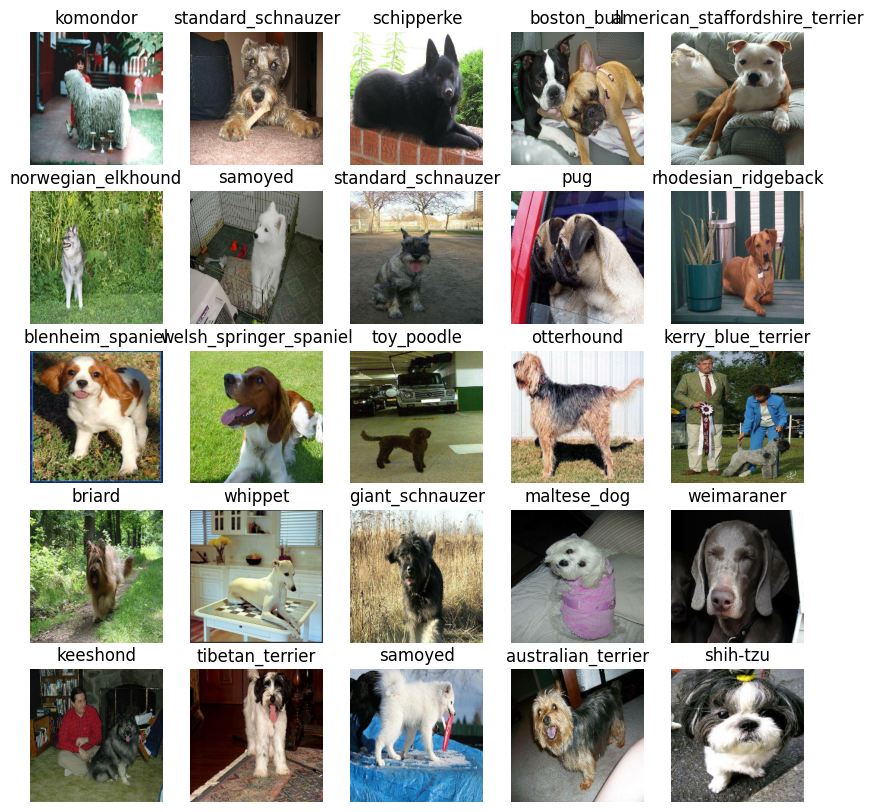

In [44]:
train_images, train_labels = next(train_data.as_numpy_iterator())
# next() : Return the next item from the iterator.
# .as_numpy_iterator() : A method which returns an iterator which converts all elements of the dataset to numpy

# Now let's visualize the data in a training batch
show_25_images(train_images, train_labels)

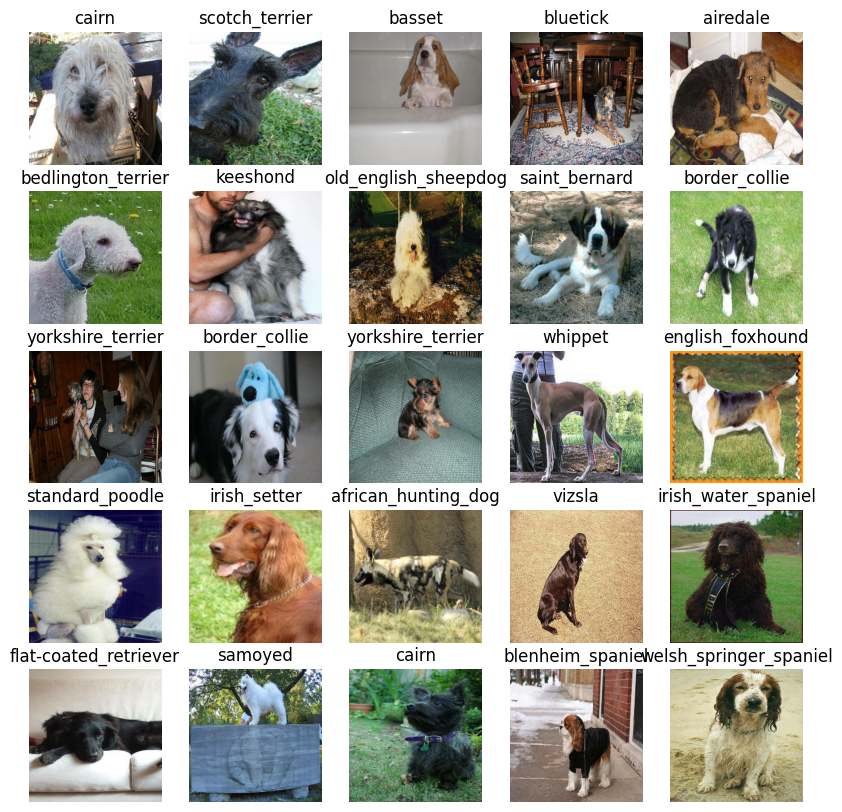

In [45]:
# Now let's visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

Before we build a model, there are few things we need to define:
* The input shape (our images shape, in the form of Tensors) to our model.
* The output shape (image labels, in the form of Tensors) of our model.
* The URL of model we want to use from TensorFlow Hub - https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4

In [46]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

Now we've got our inputs, outputs and model ready to go. Let's put them together into a Keras deep learning model!
Knowing this, let's create a function which:
* Takes the input shape, output shape and the model we've chosen as parameters
* Defines the layers in a Keras model in sequential fashion (do this first, then this, then that)
* Compiles the model (says it should be evaluated and improved)
* Builds the model (tells the model the input shape it'll be getting)
* Returns the model

All these steps can be found here: https://www.tensorflow.org/guide/keras/overview

Resources:
* https://towardsdatascience.com/a-comprehensive-guide-to-convolutional-neural-networks-the-eli5-way-3bd2b1164a53
* https://towardsdatascience.com/review-mobilenetv2-light-weight-model-image-classification-8febb490e61c
* https://en.wikipedia.org/wiki/Softmax_function

In [47]:
# Create a function which builds a Keras model
def create_model(input_shape = INPUT_SHAPE, output_shape = OUTPUT_SHAPE, model_url = MODEL_URL):
  print("Building model with: ", MODEL_URL)

  # Setup the model layers
  model  =tf.keras.Sequential([ #  Sequential groups a linear stack of layers into a tf.keras.Mode
      hub.KerasLayer(MODEL_URL), # Layer 1 (input layer) -> Creates a 'KerasLayer' of MODEL_URL
      tf.keras.layers.Dense(units = OUTPUT_SHAPE, # generally mobv2 output size = 1280, but here we want only upto "OUTPUT_SHAPE"
                            activation = "softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss = tf.keras.losses.CategoricalCrossentropy(), # loss is a measure of how well the model is guessing
      optimizer = tf.keras.optimizers.Adam(), # function that helps the model in improving guesses
      metrics = ["accuracy"] # metric : way of evaluating
  )

  # If we had binary classification , we might use : Activation = Sigmoid & Loss = Binary Crossentropy, but we're doing multi class, so we don't change anything above

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [48]:
model = create_model()
model.summary()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


## Creating callbacks

Callbacks are a helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving

We 'll create 2 callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long

### TensorBoard Callback

To setup a TensorBoard Callback, we need to do 3 things:
1. Load the TensorBoard notebook extension
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function.
3. Visualize our models training logs with the `%tensorboard` magic function (we'll do this after model training)

In [49]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [50]:
import datetime # importing it so that we can track an experiment by the time that you ran that experiment

# Create a function to build a TensorBoard Callback
def create_tensorboard_callback():

  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/MyDrive/Dog Vision/dog-breed-identification/logs", # accessing path names
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping Callback
Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [51]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor = "val_accuracy",
                                                  patience = 3)

### Training a model (on subset of data)
Our first model is only going to train on 1000 images, to make sure everything is working

In [52]:
## {No. of epochs} = how many passes of the data we'd like our model to do
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

Let's create a function which trains a model:
* Create a model usng `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model passing it the training data, validation data, number of epochs to train for (NUM_EPOCHS) and the callbacks we'd like to use
* Return the model

In [53]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained model
  """
  # Create a model
  model = create_model()

  # Create neew TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x = train_data,
            epochs = NUM_EPOCHS,
            validation_data = val_data,
            validation_freq = 1,
            callbacks = [tensorboard, early_stopping])

  # Return the fitted model
  return model


In [54]:
# Fit the model to the data
model = train_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 232s 8s/step - loss: 4.5801 - accuracy: 0.0975 - val_loss: 3.3535 - val_accuracy: 0.2600
Epoch 2/100
25/25 [==============================] - 5s 212ms/step - loss: 1.6405 - accuracy: 0.6913 - val_loss: 2.1561 - val_accuracy: 0.5000
Epoch 3/100
25/25 [==============================] - 4s 174ms/step - loss: 0.5629 - accuracy: 0.9300 - val_loss: 1.6981 - val_accuracy: 0.6150
Epoch 4/100
25/25 [==============================] - 4s 165ms/step - loss: 0.2519 - accuracy: 0.9862 - val_loss: 1.4895 - val_accuracy: 0.6650
Epoch 5/100
25/25 [==============================] - 5s 209ms/step - loss: 0.1436 - accuracy: 0.9987 - val_loss: 1.4129 - val_accuracy: 0.6750
Epoch 6/100
25/25 [==============================] - 4s 168ms/step - loss: 0.0986 - accuracy: 1.0000 - val_loss: 1.3676 - val_accuracy: 0.6800
Epoch 7/100
25/25 [==============================

It looks like our model is overfitting because it's performing ar better on the training dataset than the validation dataset, so we have to prevent model overfitting in deep learning neural networks!

**Note**: Overfitting to begin with is a good thing! It means our model is learning

### Checking the TensorBoard logs
 The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize its contents.

In [55]:
%tensorboard --logdir drive/MyDrive/Dog\ Vision/dog-breed-identification/logs

<IPython.core.display.Javascript object>

### Making and evaluating predictions using a trained model

In [56]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [57]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose = 1) # verbose : when you're making predictions, show me the progress
predictions

7/7 [==============================] - 1s 113ms/step


array([[1.3104822e-03, 8.5060770e-04, 2.2814842e-03, ..., 3.2297437e-04,
        1.6357667e-04, 7.8961224e-04],
       [1.0551083e-03, 1.2416845e-03, 5.2209161e-03, ..., 2.7607477e-04,
        2.3133188e-04, 4.1029140e-05],
       [1.9751331e-05, 1.5246410e-05, 3.7842587e-05, ..., 6.9310387e-05,
        3.3829157e-05, 1.1224735e-04],
       ...,
       [2.5188078e-06, 1.0849248e-05, 3.9225420e-06, ..., 3.7557122e-06,
        1.0184102e-05, 3.8852020e-05],
       [2.6190053e-03, 1.8719499e-04, 6.6936773e-05, ..., 6.0977374e-05,
        4.6195069e-05, 1.3730190e-02],
       [2.8518686e-04, 1.5862959e-05, 1.8827926e-03, ..., 2.7723983e-03,
        7.3640072e-04, 8.7446660e-06]], dtype=float32)

In [58]:
predictions.shape, len(y_val), len(unique_breeds)

((200, 120), 200, 120)

In [59]:
len(predictions[0]), np.sum(predictions[0])

(120, 0.99999994)

In [60]:
predictions[0]

array([1.31048216e-03, 8.50607699e-04, 2.28148419e-03, 4.49323270e-04,
       1.20749501e-04, 6.53017778e-05, 2.03455482e-02, 2.58415705e-04,
       1.58358001e-04, 2.34564068e-03, 2.12968429e-04, 4.79789887e-05,
       5.52469683e-05, 7.47135782e-05, 4.74282482e-04, 3.51940194e-04,
       8.21999492e-06, 2.03389823e-01, 2.23836760e-05, 1.74810280e-04,
       1.19516137e-03, 4.11961606e-04, 3.64924126e-05, 1.16657396e-03,
       2.12872164e-05, 8.07693068e-05, 1.69545919e-01, 5.59518048e-05,
       9.78039694e-04, 5.94029145e-04, 1.49513056e-04, 7.06884544e-03,
       4.20891040e-04, 1.74707893e-05, 7.11147586e-05, 5.43020777e-02,
       3.91775757e-05, 5.85500151e-04, 9.12244213e-05, 8.33962076e-06,
       8.60059285e-04, 7.25833743e-05, 2.19781563e-04, 1.29056192e-04,
       1.89943166e-05, 1.54658817e-04, 2.05735087e-05, 2.34831532e-04,
       9.19106707e-04, 1.00448982e-04, 2.39333123e-04, 1.56226888e-05,
       8.72632198e-04, 1.34540373e-04, 1.25041537e-04, 5.27305019e-05,
      

In [61]:
# First prediction
index = 37
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[6.4684232e-06 3.8986935e-05 6.4483902e-05 2.7147803e-04 9.5522375e-04
 3.4381219e-03 3.9939694e-03 1.0329303e-02 1.5058328e-04 3.0805796e-04
 8.0298290e-05 1.4916698e-04 2.2996744e-02 1.5741349e-05 5.6233294e-03
 7.2750478e-04 7.9353551e-05 5.9823137e-06 4.8850226e-05 2.5427340e-05
 2.6417039e-05 1.0718550e-04 5.7198427e-05 7.5088887e-05 3.5708028e-04
 6.7433633e-05 7.3276527e-07 4.1979129e-04 1.7162155e-04 6.6890105e-05
 1.1437073e-03 2.3311743e-06 2.3559538e-04 1.7910590e-04 5.1418650e-05
 2.7696200e-05 2.2011533e-05 5.9962075e-04 8.2006925e-01 3.9766691e-04
 3.7652394e-04 8.2172373e-06 1.3966759e-03 4.1151574e-04 9.5925003e-04
 7.2803255e-06 6.5329326e-03 5.6963018e-04 1.1622938e-05 2.6041025e-04
 3.7571974e-04 1.3830586e-04 5.1363074e-04 5.5668049e-04 2.5868216e-03
 4.2868065e-04 2.1988004e-04 1.6356905e-03 1.6308788e-04 4.2884382e-03
 1.8684438e-03 9.7693655e-06 7.2425879e-05 2.8773193e-04 5.0530994e-05
 1.8107980e-04 1.1044997e-04 5.0981570e-04 1.4092667e-06 9.4694129e-05
 6.004

In [62]:
unique_breeds[38]

'doberman'

Having the above functionality is great but we want to be able to do it at scale.

And it would be even better if we could see the image the prediction is being made on.

**Note**: Prediction probabilities are also known as confidence levels

In [63]:
# Turn prediction probabilities into their respective labels (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[29])
pred_label


'dingo'

Now since our validation set is still in a batch dataset, we'll have to unbatchify to make predictions on the validation images and then compare those predictions to the validation labels (truth labels)

In [64]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [65]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and return separate arrays of images and labels.
  """
  images = []
  labels = []

  # Loop through the unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now we've got ways to get:
* Prediction labels
* Validation labels (truth labels)
* Validation images

Let's make some function to make these all a bit more visualize

We'll create a function which:
* Takes an array of prediction probabilites, an array of truth labels and an array of images and an integer.
* Convert the prediction probabilites to a predicted model
* Plot the predicted label, it's predicted probability, the truth label and target image on a single plot

In [66]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change the plot title to be predicted, probability of prediction and truth label:
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color = color)

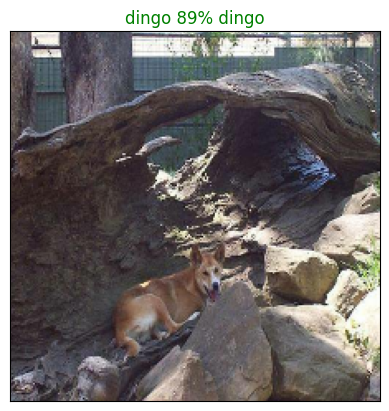

In [67]:
plot_pred(prediction_probabilities = predictions,
          labels = val_labels,
          images = val_images,
          n = 29)

Now we've got one function to visualize our models top predictions, let's make another to view our models top 10 predictions.

This function will:
* Take an input of prediction probabilities array and a ground truth array and an integer
* Find the prediction using `get_pred_label()`
* Find the top 10:
  * Prediction possibilities indexes
  * Prediction probabilities values
  * Prediction labels
* Plot the top 10 predictions probability values and labels, coloring the true label green

In [68]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1] # will return indexes with highest value in descending order

  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color = "grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels = top_10_pred_labels,
             rotation = "vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

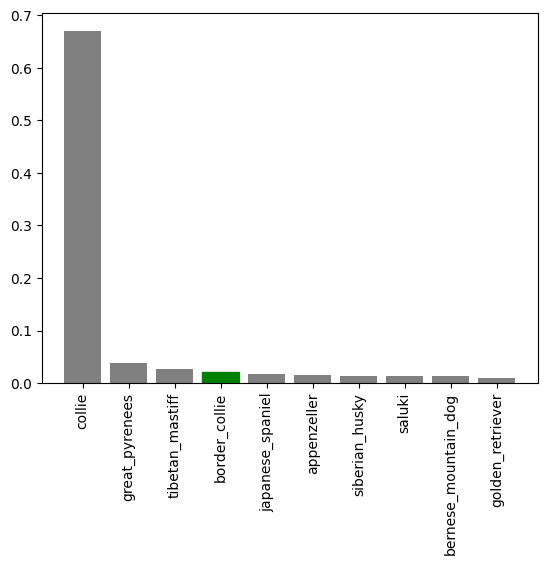

In [69]:
plot_pred_conf(prediction_probabilities = predictions,
               labels = val_labels,
               n = 9)

Now we've got some function to help us visualize our predictions and evalute our model, let's check out a few

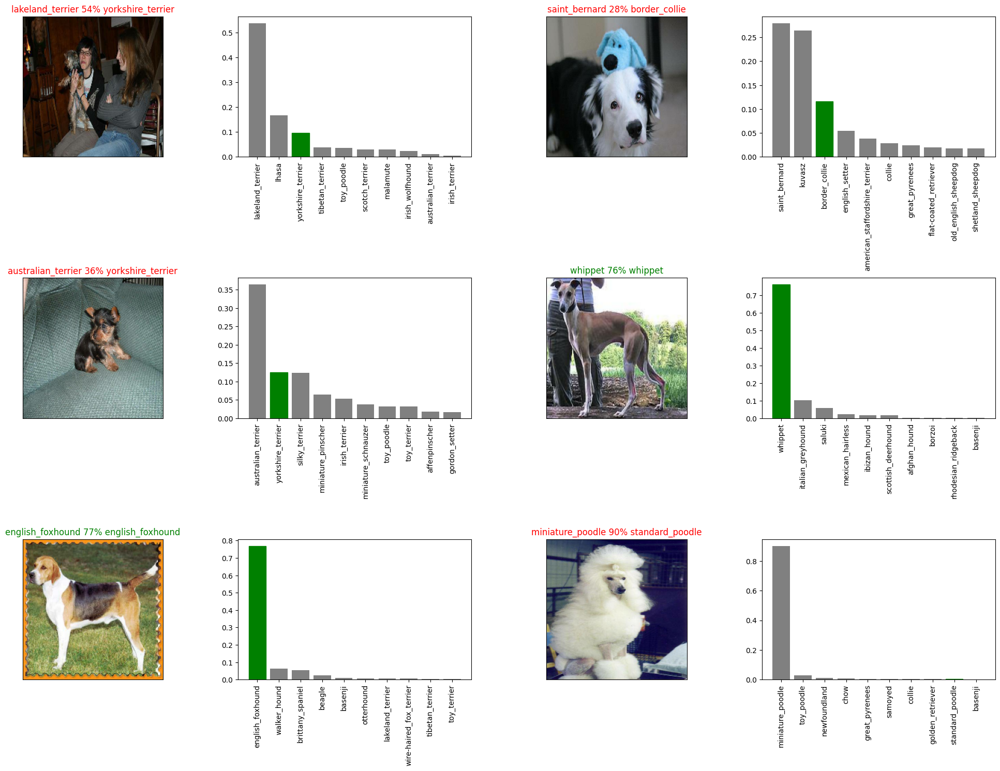

In [70]:
# Let's check out a few predictions and thier different values
i_multiplier = 10
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize = (10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities = predictions,
            labels = val_labels,
            images = val_images,
            n = i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities = predictions,
                 labels = val_labels,
                 n = i+i_multiplier)
plt.tight_layout(h_pad = 1.0)
plt.show()

## Saving and reloading a model

In [71]:
# Create a function to save a model
def save_model(model, suffix = None):
  """
  Saves a given model in models directory and appends a suffix (string).
  """

  # Create a model directoy pathname with current time
  modeldir = os.path.join("drive/MyDrive/Dog Vision/dog-breed-identification/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # extension of save format of a model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [72]:
 # Create a function to load a trained model
def load_model(model_path):
  """
  Loads a save model form a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects = {"KerasLayer":hub.KerasLayer})
  return model

Now we've got functions to save and load a trained model, let's make sure they work!

In [73]:
# Save our model trained on 1000 images
save_model(model, suffix = "1000-images-mobilenetv2-Adam")

Saving model to: drive/MyDrive/Dog Vision/dog-breed-identification/models/20240301-08331709282028-1000-images-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/Dog Vision/dog-breed-identification/models/20240301-08331709282028-1000-images-mobilenetv2-Adam.h5'

In [74]:
# Load a trained model
loaded_1000_image_model = load_model('drive/MyDrive/Dog Vision/dog-breed-identification/models/20240228-22591709161195-1000-images-mobilenetv2-Adam.h5')

Loading saved model from: drive/MyDrive/Dog Vision/dog-breed-identification/models/20240228-22591709161195-1000-images-mobilenetv2-Adam.h5


In [75]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 153ms/step - loss: 1.2625 - accuracy: 0.6900


[1.2624577283859253, 0.6899999976158142]

In [76]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 2s 164ms/step - loss: 1.2644 - accuracy: 0.6700


[1.26444411277771, 0.6700000166893005]

## Training a big dog model (on the full data)


In [77]:
len(x), len(y)

(10222, 10222)

In [78]:
# Create a data batch with the full data set
full_data = create_data_batches(x,y)

Creating training data batches...


In [79]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [80]:
# Create a model for full model
full_model = create_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [81]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()

# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor = "accuracy",
                                                             patience = 3)

**Note**: Running the cell below will take a little while because it has to load all of images into memory

In [82]:
# Fit the full model to the full data
full_model.fit(x = full_data,
               epochs = NUM_EPOCHS,
               callbacks = [full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 46s 133ms/step - loss: 1.3286 - accuracy: 0.6737
Epoch 2/100
320/320 [==============================] - 52s 162ms/step - loss: 0.3999 - accuracy: 0.8845
Epoch 3/100
320/320 [==============================] - 42s 133ms/step - loss: 0.2383 - accuracy: 0.9341
Epoch 4/100
320/320 [==============================] - 47s 146ms/step - loss: 0.1548 - accuracy: 0.9627
Epoch 5/100
320/320 [==============================] - 42s 132ms/step - loss: 0.1090 - accuracy: 0.9765
Epoch 6/100
320/320 [==============================] - 43s 133ms/step - loss: 0.0771 - accuracy: 0.9877
Epoch 7/100
320/320 [==============================] - 43s 135ms/step - loss: 0.0592 - accuracy: 0.9903
Epoch 8/100
320/320 [==============================] - 44s 137ms/step - loss: 0.0462 - accuracy: 0.9942
Epoch 9/100
320/320 [==============================] - 44s 138ms/step - loss: 0.0361 - accuracy: 0.9961
Epoch 10/100
320/320 [==============================] - 46s 144m

In [83]:
save_model(full_model, suffix = "full-image-set-mobilenetv2-Adam")

Saving model to: drive/MyDrive/Dog Vision/dog-breed-identification/models/20240301-08541709283299-full-image-set-mobilenetv2-Adam.h5...


'drive/MyDrive/Dog Vision/dog-breed-identification/models/20240301-08541709283299-full-image-set-mobilenetv2-Adam.h5'

In [84]:
# Load in the full model , write above output as this input
loaded_full_model = load_model('drive/MyDrive/Dog Vision/dog-breed-identification/models/20240301-08541709283299-full-image-set-mobilenetv2-Adam.h5')

Loading saved model from: drive/MyDrive/Dog Vision/dog-breed-identification/models/20240301-08541709283299-full-image-set-mobilenetv2-Adam.h5


## Making predictions on the test dataset
Since our model has been trained on images in the form of Tensor batches,  to make predictions on the test data, we'll have to get it into the same format

Also, we created `create_data_batches()` earlier which can take a list of filenames as input and convert them into Tensor batches.

To make predictions on the test data, we'll:
* Get the test image filenames
* Convert the filenames into test data batches using `create_data_batches()` and setting the `test_data` parameter to `True` (since the test data doesn't have labels).
* Make a predictions array by passing the test batches to the `predict()` method called on our model.

In [85]:
# Load test image filenames
test_path = "drive/MyDrive/Dog Vision/dog-breed-identification/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dog Vision/dog-breed-identification/test/e85d4e2707683df0e6387e19b67b873d.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/test/e8763575a23f1e1a86788b82bd105f07.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/test/e7e9624f2a2e61ab187358f5968bfde8.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/test/e7f95aabf775a636b3893ffa120adaf9.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/test/e7feb64da6aae1ef8e62453f6660d0c5.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/test/e7b4b0e7d7d76f8dbd64920f34443b25.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/test/e7dc8cc599049ea9fa2a172c88646c57.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/test/e83d7fa8fdfba0ec577f9c8df811d439.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/test/e806a67a05289ac6de6831001664b81b.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/test/e78b4a09e5f86c330e24c6aaed63f0be.jpg']

In [86]:
len(test_filenames)

10357

In [87]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data = True)

Creating the test batches...


In [88]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note**: Calling `predict()` on our full model and passing it the test data batch will take a long time to run. This is because we have to process 10000+ images and get our model to find patterns in those images and generate predictions based on what it's learned in the training dataset

In [89]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose = 1)

324/324 [==============================] - 1749s 5s/step


In [90]:
# Save predictions (NumPy array) to csv file (for access later)
np.savetxt("drive/MyDrive/Dog Vision/dog-breed-identification/preds_array.csv", test_predictions, delimiter = ",")

In [91]:
# Load predictions (NumPy array) from csv file
test_predictions = np.loadtxt("drive/MyDrive/Dog Vision/dog-breed-identification/preds_array.csv", delimiter = ",")

In [92]:
test_predictions[:10]

array([[5.06188069e-09, 2.11491085e-11, 5.09543067e-11, ...,
        1.80969850e-09, 8.51434548e-12, 5.16669481e-08],
       [2.72727374e-09, 9.15451892e-09, 1.63416364e-10, ...,
        4.83671458e-09, 8.08773274e-12, 1.81977065e-08],
       [1.88050153e-09, 4.46206752e-11, 7.52915730e-10, ...,
        1.53458057e-09, 2.74025358e-10, 3.92921751e-10],
       ...,
       [3.38393841e-10, 7.45520798e-11, 1.60326060e-12, ...,
        5.89522398e-12, 3.38595558e-12, 1.54713675e-09],
       [4.44096039e-16, 1.72959176e-08, 1.00181875e-12, ...,
        5.79191251e-10, 8.47406929e-14, 1.07041600e-13],
       [1.12858720e-06, 4.34167768e-09, 4.52969289e-08, ...,
        7.30760512e-05, 2.99489056e-09, 2.10199835e-09]])

In [93]:
test_predictions.shape

(10357, 120)

## Preparing test dataset predictions for Kaggle
Looking at the Kaggle sample submission, we find that it wants our models prediction probability outputs in a DataFrame with an ID and a column for each different dog breed. { https://kaggle.com/c/dog-breed-identification/overview/evaluation }

To get the data in this format, we'll:
* Create a pandas DataFrame with an ID column as well as a column for each dog breed
* Add data to the ID column by extracting the test image ID's from their filepaths.
* Add data (the prediction probabilities) to each of the dog breed columns.
* Export the DataFrame as a CSV to submit it to Kaggle.


In [94]:
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns = ["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [95]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [96]:
os.path.splitext(test_filenames[0])

('drive/MyDrive/Dog Vision/dog-breed-identification/test/e85d4e2707683df0e6387e19b67b873d',
 '.jpg')

In [97]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e85d4e2707683df0e6387e19b67b873d,5.061881e-09,2.114911e-11,5.095431e-11,4.334191e-06,2.841961e-05,4.690665e-12,2.995105e-08,3.721288e-12,7.399512e-11,...,2.883261e-08,3.931310e-09,1.347010e-09,3.201854e-10,5.333893e-13,3.542637e-09,1.909123e-10,1.809699e-09,8.514345e-12,5.166695e-08
1,e8763575a23f1e1a86788b82bd105f07,2.727274e-09,9.154519e-09,1.634164e-10,3.144794e-10,4.401186e-08,1.501014e-11,9.608406e-14,2.124783e-11,9.529958e-07,...,9.824574e-08,3.576318e-11,7.354725e-13,5.666420e-12,1.572865e-09,3.576120e-11,1.107353e-10,4.836715e-09,8.087733e-12,1.819771e-08
2,e7e9624f2a2e61ab187358f5968bfde8,1.880502e-09,4.462068e-11,7.529157e-10,1.361394e-11,5.710627e-09,6.430104e-09,1.355233e-11,3.804460e-09,6.030013e-09,...,2.966643e-09,6.866791e-09,1.207154e-08,5.657612e-09,9.543847e-11,2.580082e-08,1.880132e-09,1.534581e-09,2.740254e-10,3.929218e-10
3,e7f95aabf775a636b3893ffa120adaf9,7.325241e-01,9.285964e-10,3.513509e-09,1.522475e-11,5.666655e-08,1.455033e-10,8.980897e-08,2.747976e-09,1.043454e-09,...,2.445630e-05,3.774598e-08,3.706873e-09,2.905931e-09,4.681344e-09,2.324023e-10,1.987183e-10,2.989785e-10,4.342042e-08,6.762682e-05
4,e7feb64da6aae1ef8e62453f6660d0c5,2.599304e-08,1.137159e-06,5.016203e-10,2.212545e-08,5.792482e-08,3.864420e-07,3.089172e-07,3.711568e-08,2.457879e-09,...,3.715059e-03,5.935075e-08,6.937836e-07,3.661623e-08,1.140889e-07,9.004019e-09,4.308842e-10,3.946001e-09,2.107399e-08,5.912205e-05


In [99]:
# Save our predictions dataframe to CSV for submission to Kaggle
preds_df.to_csv("drive/MyDrive/Dog Vision/dog-breed-identification/full_model_predictions_submission_mobilenetV2.csv",
                index = False)

## Making predictions on custom images
To make predictions on custom images, we'll:

* Get the filepaths of our own images.
* Turn the filepaths into data batches using create_data_batches(). And since our custom images won't have labels, we set the test_data parameter to True.
* Pass the custom image data batch to our model's predict() method.
* Convert the prediction output probabilities to predictions labels.
* Compare the predicted labels to the custom images.

**Note**: Since I lost my GPU backed By google, re-running will take hours, so here I am writing the code in the form of 'text'

## Get custom image filepaths
* custom_path = "drive/MyDrive/Dog Vision/
* dog-breed-identification/my-dog-photos/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]
* custom_image_paths

## Turn custom images into batch datasets
* custom_data = create_data_batches(custom_image_paths, test_data=True)
* custom_data

## Make predictions on the custom data
* custom_preds = loaded_full_model.predict(custom_data)
* custom_preds.shape


## Get custom image prediction labels
* custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
* custom_pred_labels

## Get custom images (our unbatchify() function won't work since there aren't labels)
* custom_images = []

## Loop through unbatched data
* for image in custom_data.unbatch().as_numpy_iterator():
  * custom_images.append(image)

## Check custom image predictions
* plt.figure(figsize=(10, 10))
* for i, image in enumerate(custom_images):
  * plt.subplot(1, 3, i+1)
  * plt.xticks([])
  * plt.yticks([])
  * plt.title(custom_pred_labels[i])
  * plt.imshow(image)